In [45]:
import os
import sys
# sys.path.append('/home/el2522/.local/lib/python3.8/site-packages')
import pandas as pd
import numpy as np
import shap
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from sklearn.preprocessing import StandardScaler,  MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_selection import RFECV

pd.set_option('display.max_columns', None)

import random
import itertools
from sklearn.model_selection import KFold
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import TensorDataset, DataLoader
from torch.optim.lr_scheduler import StepLR

import scipy.stats as stats
from scipy.stats import mannwhitneyu, ttest_ind, chi2_contingency, fisher_exact, shapiro
import statsmodels.api as sm
import pickle
np.random.seed(66)
sys.path.append('/data/master/DS217/users/el2522')


In [46]:
# Load the data
data_dir = '/data/master/DS217/users/el2522/'
file_path = os.path.join(data_dir, 'ventDataPrep/intermediate/df_imputed.pkl')
df = pd.read_pickle(file_path)

## Feature Engineering

In [47]:
df.columns

Index(['encounterId', 'utcChartTime', 'age', 'gender', 'weight', 'hospital',
       'diagnosis', 'ethnicity', 'PIM', 'MAP', 'TV(measured)', 'RR(measured)',
       'etCO2', 'temp', 'HR', 'SpO2', 'systolicBP', 'meanBP', 'diastolicBP',
       'pH', 'PCO2', 'baseExcess', 'lactate', 'HCO3', 'WBC', 'Neutrophil',
       'Hb', 'fluidBalance', 'NMB', 'sedation', 'furosemide', 'vasoActive',
       'steroid', 'FiO2', 'PIP', 'RR(set)', 'PEEP(set)', 'inspTime', 'PS+PEEP',
       'ifDeceased', 'LOV', 'LOS', 'ettInst', 'airwayType', 'timestamp',
       'ventMode_NIV', 'ventMode_NoSupport', 'ventMode_PC', 'ventMode_PS',
       'airwayStatus_Extubated', 'airwayStatus_Intubated',
       'airwayStatus_TubeKeptIn', 'airwayStatus_TubeKeptOut', 'PS', 'SFRatio',
       'TVbyWeight', 'RRRatio', 'IERatio', 'deltaP', 'mPower', 'age_group'],
      dtype='object')

In [48]:
df = pd.get_dummies(df, columns=['diagnosis', 'ethnicity'])

In [49]:
# define vars
demo_cols = ['gender','age', 'weight', 'PIM'] + [x for x in df.columns if 
                                            x.startswith(('ethnicity', 'diagnosis'))]

age_dependent_cols = ['HR', 'systolicBP', 'meanBP', 'diastolicBP']

categoric_cols = ['NMB', 'sedation', 'furosemide', 'vasoActive', 'steroid', 'ventMode_PC', 'ventMode_PS']

numerical_cols = ['timestamp', 'MAP','RR(measured)', 'etCO2', 'temp', 'HR', 'SpO2',
       'systolicBP', 'meanBP', 'diastolicBP', 'pH', 'PCO2', 'baseExcess',
       'lactate', 'HCO3', 'WBC', 'Neutrophil', 'Hb', 'fluidBalance', 'FiO2', 'PIP',
       'RR(set)', 'PEEP(set)', 'inspTime', 'PS', 'TVbyWeight', 'RRRatio',
       'IERatio', 'deltaP', 'mPower', 'SFRatio']

physio_measure = ['timestamp', 'gender', 'age_group', 'weight', 'RR(measured)', 'temp', 'HR', 'SpO2', 'systolicBP',
       'meanBP', 'diastolicBP', 'pH', 'PCO2', 'baseExcess', 'lactate', 'HCO3', 'WBC',
       'Neutrophil', 'Hb', 'fluidBalance']

In [50]:
# Convert data type
for col in categoric_cols+['gender','age']+[x for x in df.columns if 
                                            x.startswith(('ethnicity', 'diagnosis'))]:
    df[col] = df[col].astype('int')

# Round the timestamp to the nearest whole number and then convert to int
df[['timestamp', 'LOV']] = np.round(df[['timestamp', 'LOV']]).astype(int)
    
# Identify the timestep of the first instance of NIV or NoSupport for each encounterId:
first_extubation_time = df.groupby('encounterId').apply(
    lambda group: group[(group['airwayStatus_Extubated'] == 1)]['timestamp'].min() 
                  if not group[(group['airwayStatus_Extubated'] == 1)]['timestamp'].empty 
                  else group['timestamp'].iloc[-1]
)
df['first_extubation_time'] = df['encounterId'].map(first_extubation_time)


In [51]:
def compute_outcomes_with_censoring(group, cut_off=24*28):
    group.set_index('timestamp', inplace=True)
    
    # Identify the timestep of the first instance of NIV or NoSupport for each encounterId:
    vent_start = group[group.airwayStatus_Intubated==1].first_valid_index()
    vent_end = group[group.airwayStatus_Extubated==1].last_valid_index()
    
    
    # Censoring indicator
    # It's event (0) if we don't have a complete 48-hour observation window post-extubation,
    if (vent_end is None) | (group[['airwayStatus_Intubated', 'airwayStatus_TubeKeptIn']].iloc[-1].sum()!=0):
        if group['ifDeceased'].iloc[0]==1:
            event_description = 'Not Extubated - Deceased'
        else:
            event_description = 'Not Extubated - Alive'
    elif (group['airwayStatus_TubeKeptOut'].iloc[-48:].sum()!=48):
        if group['ifDeceased'].iloc[0]==1:
            event_description = 'No 48h Observation - Deceased'
        else:
            event_description = f'No 48h Observation - Alive'
    elif group['airwayStatus_TubeKeptOut'].iloc[-48:].sum()==48:
        event_description = "Successful Extubation"
    
    vent_end = int(vent_end) if not event_description.startswith('Not Extubated') else int(group.index[-1])
    if (vent_end-vent_start) > cut_off:
        event_description = f'Not Extubated - Cut Off at {cut_off}H'
        vent_end = int(cut_off + vent_start)
        
    num_intub = group.loc[:vent_end].airwayStatus_Intubated.sum()

    return pd.Series({
        'vent_start_time': int(vent_start),
        'vent_end_time': int(vent_end),
        'num_intub': int(num_intub),
        'event_description': event_description,
    })

# Apply function and merge results
cut_off = 10000
vent_outcome = df.groupby('encounterId').apply(
    lambda x: compute_outcomes_with_censoring(x, cut_off = cut_off)
).reset_index()
df = df.merge(vent_outcome, on='encounterId', how='left')


In [53]:
vent_outcome.groupby('num_intub').event_description.value_counts()

num_intub  event_description            
1          No 48h Observation - Alive       2259
           Successful Extubation            1746
           Not Extubated - Alive             276
           Not Extubated - Deceased          116
           No 48h Observation - Deceased      15
2          Successful Extubation             197
           No 48h Observation - Alive         96
           Not Extubated - Alive              13
           Not Extubated - Deceased            8
           No 48h Observation - Deceased       2
3          Successful Extubation              22
           No 48h Observation - Alive          8
           Not Extubated - Deceased            2
4          Successful Extubation               6
           No 48h Observation - Alive          1
           Not Extubated - Alive               1
           Not Extubated - Deceased            1
Name: count, dtype: int64

In [54]:
df_pred = df.copy()
df_pred['time_to_event'] = df_pred.groupby('encounterId').apply(
    lambda x: (x.timestamp.max()-x.timestamp).astype(int)).reset_index(drop=True)
df_pred['time_to_final_weaning'] = (df_pred.vent_end_time-df_pred.timestamp).astype(int)
df_pred['extubation_ready'] = (df_pred['time_to_final_weaning'] <= 24).astype(int) 
df_pred = df_pred[(df_pred.timestamp > df_pred.vent_start_time)]
df_pred = df_pred[(df_pred.time_to_final_weaning<=24*28)]

df_pred_without_failure = df_pred[
                                  (df_pred.num_intub==1) & (~df_pred.event_description.str.contains('Deceased'))]
df_pred_with_failure = df_pred[
                               (df_pred.num_intub>1)|(df_pred.event_description.str.contains('Deceased'))]

### Observations

In [55]:
df_demo_without_failure = df_pred_without_failure[demo_cols+['event_description']].drop_duplicates()
# Reverse one-hot encoding for diagnosis
diagnosis_cols = [x for x in df_demo_without_failure.columns if x.startswith('diagnosis')]
df_demo_without_failure['diagnosis'] = df_demo_without_failure[diagnosis_cols].idxmax(axis=1)
df_demo_without_failure['diagnosis'] = df_demo_without_failure['diagnosis'].str.replace('diagnosis_', '')

# Reverse one-hot encoding for ethnicity
ethnicity_cols = [x for x in df_demo_without_failure.columns if x.startswith('ethnicity')]
df_demo_without_failure['ethnicity'] = df_demo_without_failure[ethnicity_cols].idxmax(axis=1)
df_demo_without_failure['ethnicity'] = df_demo_without_failure['ethnicity'].str.replace('ethnicity_', '')

# Drop the original one-hot encoded columns
df_demo_without_failure.drop(columns=diagnosis_cols + ethnicity_cols, inplace=True)


### the PIM score suggests that the "not extubated" patients might be more severe ones

In [56]:
df_demo_without_failure.groupby('event_description')[['gender', 'age', 'weight', 'PIM']].agg(['count', 'mean', 'std']
                                                                                                   )

gender                       age             \
                            count      mean       std count       mean   
event_description                                                        
No 48h Observation - Alive   2259  0.573705  0.494647  2259  35.151394   
Not Extubated - Alive         276  0.507246  0.500856   276  18.181159   
Successful Extubation        1744  0.556193  0.496975  1744  29.614106   

                                      weight                         PIM  \
                                  std  count       mean        std count   
event_description                                                          
No 48h Observation - Alive  49.638999   2259  13.554723  14.205785  2259   
Not Extubated - Alive       44.943154    276   7.657022  14.500281   276   
Successful Extubation       48.641400   1744  11.407779  13.144438  1744   

                                                
                                mean       std  
event_description                               
No 48h Observation - Alive  0.033863  0.050023  
Not Extubated - Alive       0.096468  0.100800  
Successful Extubation       0.046311  0.063134

In [57]:
df_demo_without_failure.groupby('event_description')['diagnosis'].value_counts()

event_description           diagnosis       
No 48h Observation - Alive  cardiovascular       786
                            respiratory          699
                            neurological         345
                            others               286
                            infection            110
                            gastrointestinal      33
Not Extubated - Alive       cardiovascular       201
                            others                28
                            respiratory           28
                            neurological          11
                            gastrointestinal       4
                            infection              4
Successful Extubation       cardiovascular      1050
                            respiratory          362
                            others               174
                            neurological          88
                            infection             48
                            gastrointestinal      22
N

In [58]:
df_demo_without_failure.groupby('event_description')['ethnicity'].value_counts()

event_description           ethnicity                      
No 48h Observation - Alive  white or white british             1071
                            asian or asian british              414
                            others                              353
                            black or black british              287
                            mixed or multiple ethnic groups     134
Not Extubated - Alive       others                              133
                            white or white british               78
                            asian or asian british               28
                            black or black british               27
                            mixed or multiple ethnic groups      10
Successful Extubation       white or white british              740
                            others                              408
                            asian or asian british              304
                            black or black british      

In [59]:
action_cols = ['FiO2', 'PIP', 'RR(set)', 'PEEP(set)', 'inspTime', 'PS']
vent_cols = ['MAP', 'RR(measured)', 'etCO2','RRRatio', 'deltaP', 'mPower', 'SFRatio']

numerical_obs_cols_tmp = [x for x in numerical_cols if 
                          x not in ['timestamp'] and x not in action_cols+vent_cols]
numerical_cols_tmp = [x for x in numerical_cols if 
                          x not in ['timestamp']]
# categoric_cols_tmp = [x for x in categoric_cols if x not in 
#                       [x for x in df.columns if x.startswith('ventMode')]]
categoric_cols_tmp = categoric_cols

In [60]:

def plot_grouped_feature_variation(df, group_column, numerical_cols, categorical_cols, hours_col, y_scaler=None):
    """
    Plot the variation of numerical and categorical features grouped by a specified column over time.
    
    Parameters:
    - df: DataFrame containing the data.
    - group_column: The name of the column to group data by.
    - numerical_cols: List of names of numerical columns to plot.
    - categorical_cols: List of names of categorical columns to plot.
    - hours_col: The name of the column representing time/hours for the x-axis.
    """
    
    n_numerical = len(numerical_cols)
    n_categorical = len(categorical_cols)
    n_vars = n_numerical + n_categorical
    n_cols = 4
    n_rows = (n_vars + n_cols - 1) // n_cols

    plt.figure(figsize=(16, 4 * n_rows))

    # Handle the case when group_column is None
    if group_column:
        groups = df[group_column].unique()
        colors = plt.cm.rainbow(np.linspace(0, 1, len(groups)))
    else:
        groups = [None]  # Use a single group
        colors = ['blue']  # Use a single color

    # Determine global y-axis limits for numerical data if same_scale is True
    if y_scaler != None:
        global_min = y_scaler[0]
        global_max = y_scaler[1]
        df[numerical_cols] = df[numerical_cols].clip(global_min, global_max) 
        
    # Plot for numerical columns
    for i, var in enumerate(numerical_cols, 1):
        ax = plt.subplot(n_rows, n_cols, i)
        for group, color in zip(groups, colors):
            if group_column:
                grouped = df[df[group_column] == group].groupby(hours_col)[var].agg(['mean', 'std'])
            else:
                grouped = df.groupby(hours_col)[var].agg(['mean', 'std'])
            ax.plot(grouped.index, grouped['mean'], label=f"{group}", color=color)
            ax.fill_between(grouped.index, grouped['mean'] - grouped['std'], grouped['mean'] + grouped['std'], alpha=0.2, color=color)
        ax.set_xlabel(f'{hours_col}')
        ax.set_ylabel(var)
        ax.set_title(f'{var} over {hours_col}')
        ax.invert_xaxis()
        ax.axvline(x=0, color='#cccc', linestyle='--', linewidth=1)
        
        # Set the same y-axis scale for all numerical plots
        if y_scaler != None:
            ax.set_ylim(global_min, global_max)
            
    # Plot for categorical columns
    for i, var in enumerate(categorical_cols, 1 + n_numerical):
        ax = plt.subplot(n_rows, n_cols, i)
        for group, color in zip(groups, colors):
            if group_column:
                grouped = df[df[group_column] == group].groupby(hours_col)[var].mean()
            else:
                grouped = df.groupby(hours_col)[var].mean()
            ax.plot(grouped.index, grouped, label=f"{group}", color=color)
        ax.set_xlabel(f'{hours_col}')
        ax.set_ylabel(f'Proportion of {var}')
        ax.set_title(f'{var} over {hours_col}')
        ax.invert_xaxis()
        ax.axvline(x=0, color='#cccc', linestyle='--', linewidth=1)
        
    plt.tight_layout()
    if group_column:
        handles, labels = ax.get_legend_handles_labels()
        plt.figlegend(handles, labels, loc='upper right', bbox_to_anchor=(1.15, 1), title=group_column)
    plt.show()

    

In [61]:
df_pred_without_failure[df_pred_without_failure.LOV>300].encounterId.unique()

array(['10168', '11010', '11361', '12081', '12113', '12627', '13313',
       '13608', '13717', '13881', '14001', '14334', '14371', '15484',
       '15836', '15886', '15967', '16489', '16523', '16945', '17024',
       '1724', '17441', '17562', '17721', '17900', '18330', '18451',
       '22005', '26340', '27271', '27407', '2883', '28863', '29296',
       '29299', '31670', '3394', '4263', '4360', '4664', '4734', '4744',
       '4837', '5322', '6069', '6888', '7117', '7333', '7618', '7996',
       '8088', '8168', '8373', '8462', '8463', '8521', '9807',
       'NIC:1020414:1733189400', 'NIC:1026721:1741204800',
       'NIC:1036357:1754467200', 'NIC:1052344:1765648200',
       'NIC:1053934:1765911600', 'NIC:1055598:1772784000',
       'NIC:1056214:1767897000', 'NIC:1064438:1778097000',
       'NIC:1071028:1784568600', 'NIC:1071256:1783272600',
       'NIC:1071621:1797173400', 'NIC:1074476:1808243700',
       'NIC:1077988:1800919920', 'NIC:1078470:1790099880',
       'NIC:1082685:1794483960',

In [62]:
df_pred_without_failure.loc[df_pred_without_failure.encounterId=='NIC:1142983:1851896100', demo_cols]

,gender,age,weight,PIM,diagnosis_cardiovascular,diagnosis_gastrointestinal,diagnosis_infection,diagnosis_neurological,diagnosis_others,diagnosis_respiratory,ethnicity_asian or asian british,ethnicity_black or black british,ethnicity_mixed or multiple ethnic groups,ethnicity_others,ethnicity_white or white british
404040,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404041,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404042,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404043,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404044,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
404580,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404581,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404582,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404583,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0


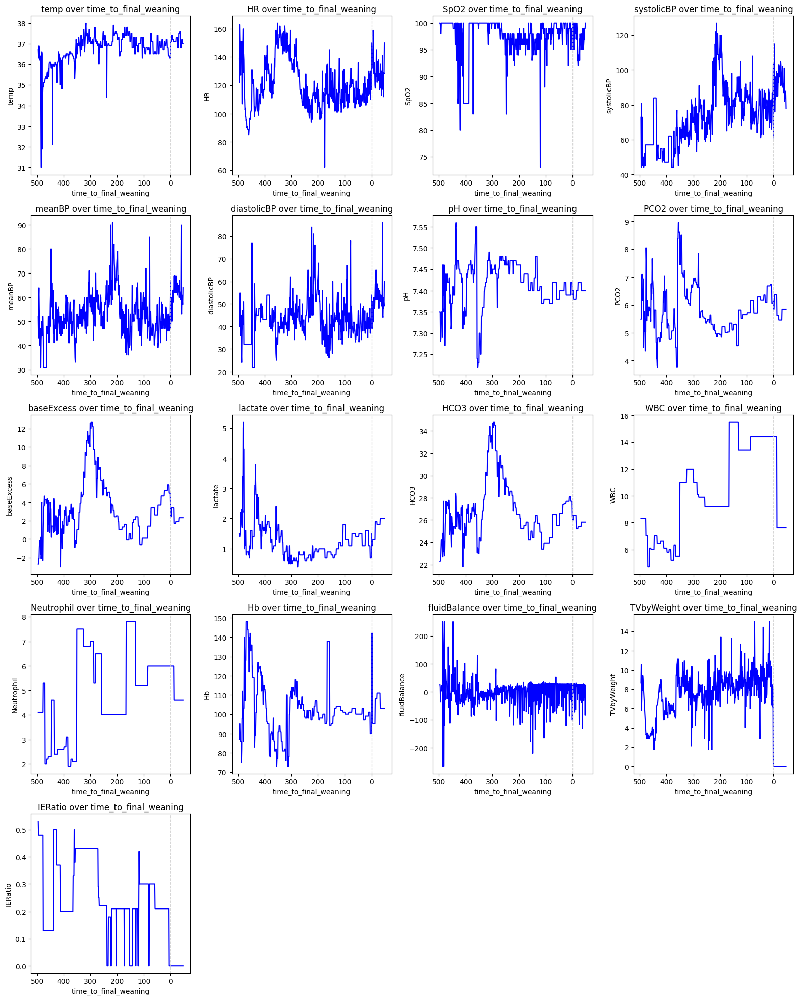

In [63]:

plot_grouped_feature_variation(
    df=df_pred_without_failure.loc[df_pred_without_failure.encounterId=='NIC:1142983:1851896100'], 
    group_column=None, 
    numerical_cols=numerical_obs_cols_tmp, 
    categorical_cols=[], 
    hours_col='time_to_final_weaning'
)

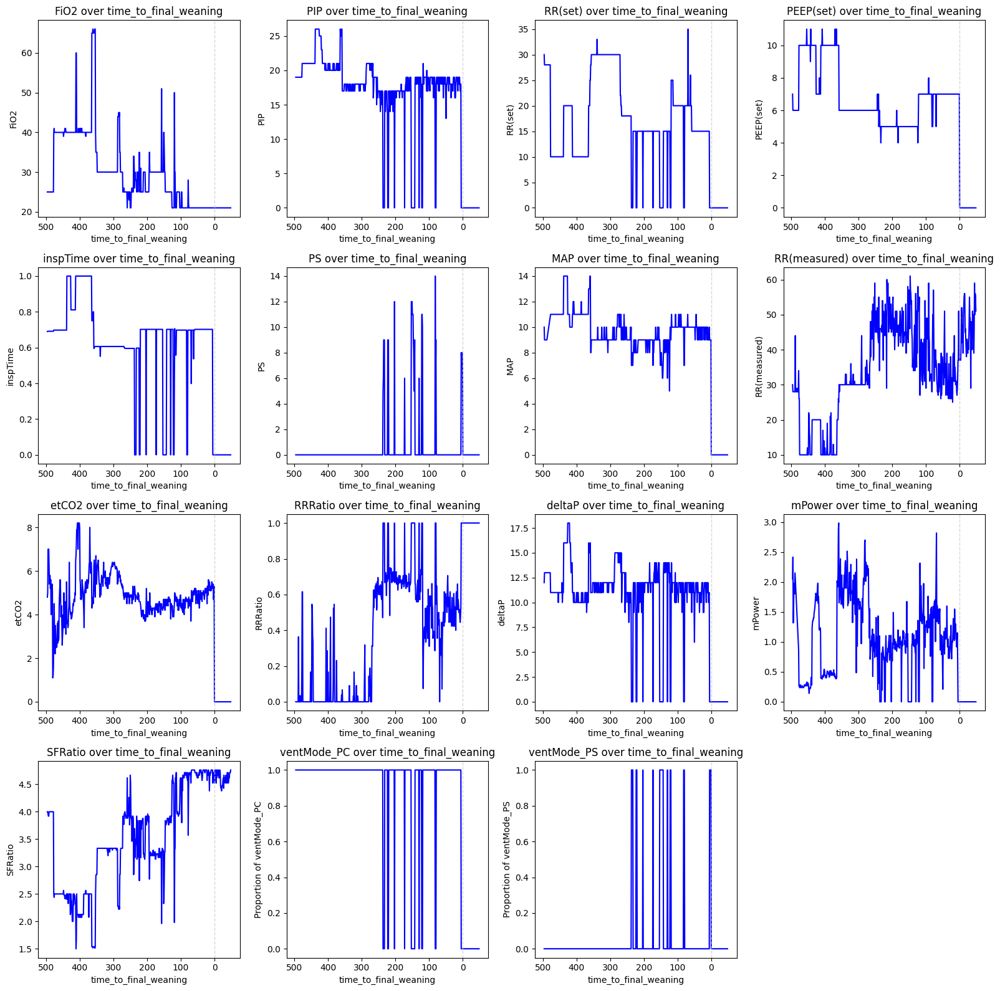

In [64]:

plot_grouped_feature_variation(
    df=df_pred_without_failure.loc[df_pred_without_failure.encounterId=='NIC:1142983:1851896100'], 
    group_column=None, 
    numerical_cols=action_cols+vent_cols, 
    categorical_cols=['ventMode_PC', 'ventMode_PS'], 
    hours_col='time_to_final_weaning'
)

### We can see systematic and significant difference on interventions, why? The effect is especially obvious on "Not Extubated" group

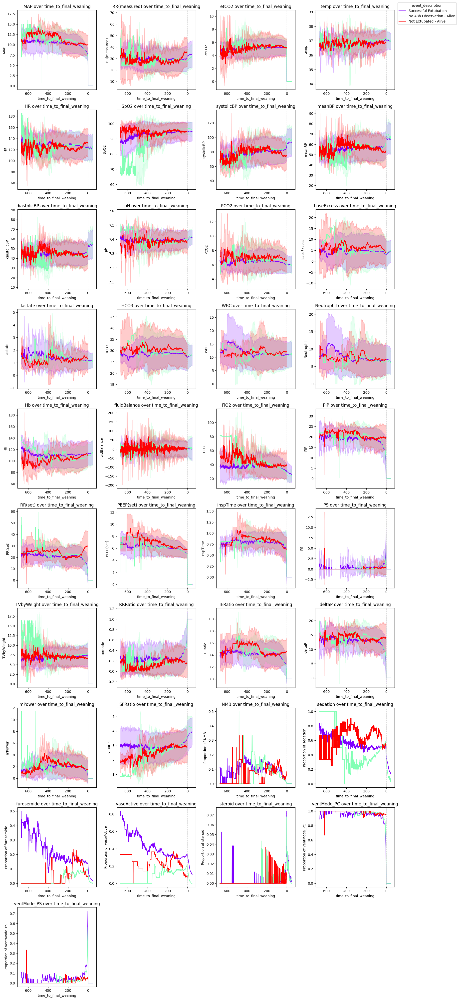

In [65]:

plot_grouped_feature_variation(
    df=df_pred_without_failure, 
    group_column='event_description', 
    numerical_cols=numerical_cols_tmp, 
    categorical_cols=categoric_cols_tmp, 
    hours_col='time_to_final_weaning'
)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


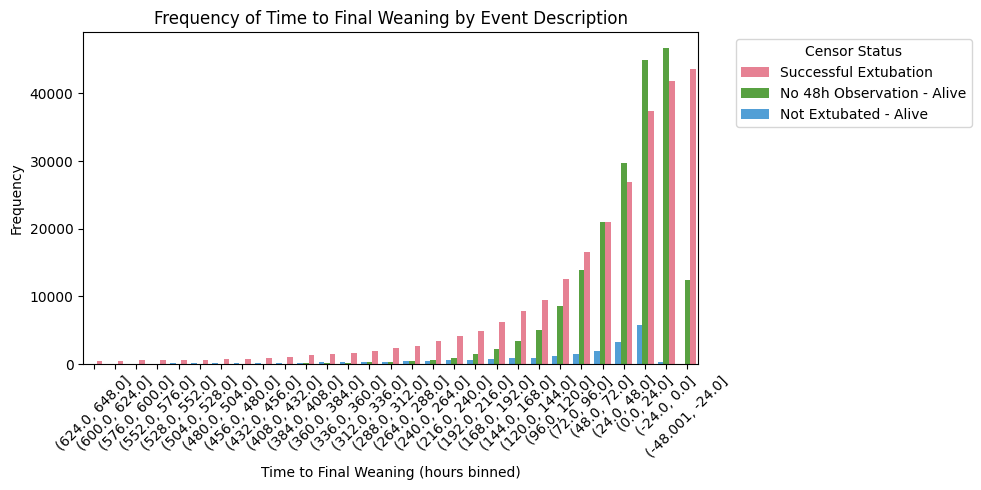

In [66]:

plt.figure(figsize=(10,5))  # Widen the figure to allow more space for each bar


# Define bin edges for hours; adjust the range and bin width as needed
bin_edges = np.arange(df_pred_without_failure['time_to_final_weaning'].min(), df_pred_without_failure['time_to_final_weaning'].max(), 24)

# Bin the 'time_to_event' data
df_pred_without_failure['time_to_final_weaning_binned'] = pd.cut(df_pred_without_failure['time_to_final_weaning'], bins=bin_edges, include_lowest=True)

# Choose a color palette with enough contrast
palette = sns.color_palette('husl', n_colors=df_pred_without_failure['event_description'].nunique())

# Create the count plot
sns.countplot(data=df_pred_without_failure, x='time_to_final_weaning_binned', hue='event_description', palette=palette)

plt.gca().invert_xaxis()  # Invert the x-axis on the current Axes object
# Improve the x-axis
plt.xticks(rotation=45)  # Rotate the labels for better legibility
plt.xlabel('Time to Final Weaning (hours binned)')
plt.ylabel('Frequency')
plt.title('Frequency of Time to Final Weaning by Event Description')

# Move the legend outside the plot to avoid covering the bars
plt.legend(title='Censor Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()  # Adjust the layout
plt.show()


In [67]:
df_pred_without_failure[df_pred_without_failure.time_to_final_weaning<=120].event_description.value_counts()

event_description
Successful Extubation         199868
No 48h Observation - Alive    177356
Not Extubated - Alive          13872
Name: count, dtype: int64

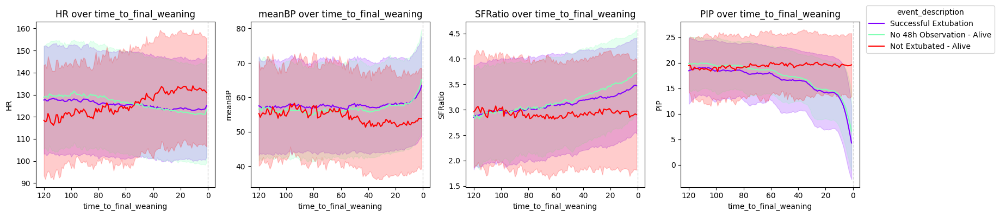

In [68]:

plot_grouped_feature_variation(
    df=df_pred_without_failure[(df_pred_without_failure.time_to_final_weaning>0)&
                               (df_pred_without_failure.time_to_final_weaning<=120)], 
    group_column='event_description', 
    numerical_cols=['HR', 'meanBP', 'SFRatio', 'PIP'], 
    categorical_cols=[], 
    hours_col='time_to_final_weaning'
)

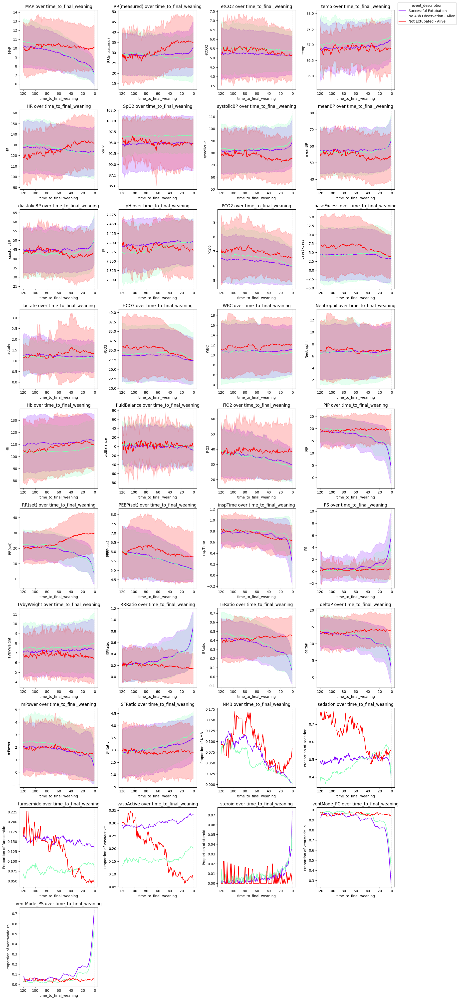

In [69]:

plot_grouped_feature_variation(
    df=df_pred_without_failure[(df_pred_without_failure.time_to_final_weaning>0)&
                               (df_pred_without_failure.time_to_final_weaning<=120)], 
    group_column='event_description', 
    numerical_cols=numerical_cols_tmp, 
    categorical_cols=categoric_cols_tmp, 
    hours_col='time_to_final_weaning'
)

In [27]:
from sklearn.linear_model import LinearRegression

epsilon = 1e-8

def compute_cv_and_slope(df_group):
    def shift_column_positive(df, column_name):
        # Calculate the minimum value of the column
        min_value = df[column_name].min()

        # If the minimum value is negative, shift the column by its absolute value
        if min_value < 0:
            df[column_name] += abs(min_value)

        return df
    
    # Ensure the group is sorted by timestamp if not already
    df_group = df_group.sort_values('timestamp').set_index('timestamp')    
    
    window = 12
    min_periods = 6
        
    for col in [x for x in numerical_cols_tmp if x not in ['timestamp']]:
        df_group = shift_column_positive(df_group, col)
        # Compute rolling standard deviation and mean
        rolling_std = df_group[col].rolling(window=window, min_periods=min_periods).std()
        rolling_mean = df_group[col].rolling(window=window, min_periods=min_periods).mean()
        rolling_scaler =  window / df_group[col].rolling(window=window, min_periods=min_periods).count()

        # Compute CV with epsilon to avoid division by zero
        df_group[f'cv_{col}'] = rolling_std / np.abs(rolling_mean + epsilon) * np.sqrt(rolling_scaler)

        # Compute slope using linear regression
        def compute_slope(x):
            start_value = x.iloc[0]
            end_value = x.iloc[-1]
            slope = (end_value - start_value) / len(x)
            return slope

        df_group[f'slope_{col}'] = df_group[col].rolling(window=window, min_periods=min_periods).apply(compute_slope)

        
    # Keep the timestamp in the resulting DataFrame
    df_group = df_group.reset_index()
    df_group = df_group.ffill().bfill()
    return df_group

# Apply the function to compute CV and slope for each encounterId for the numerical features
df_pred_without_failure = df_pred_without_failure.groupby('encounterId', as_index=False).apply(compute_cv_and_slope).reset_index(drop=True)




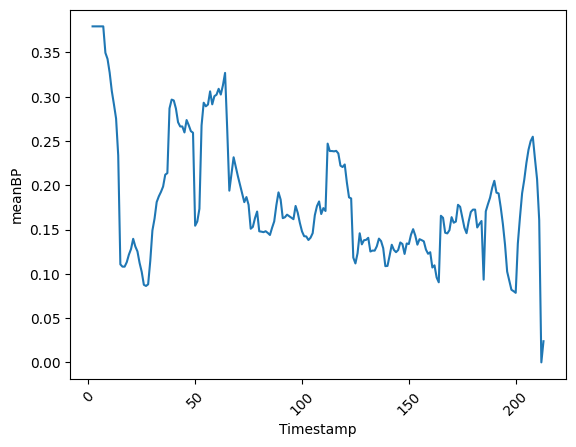

In [28]:
# Examine per subject
measure = 'meanBP'

encounter_data = df_pred_without_failure.loc[df_pred_without_failure.encounterId == '10028']

plt.plot(encounter_data['timestamp'], encounter_data[f'cv_{measure}'])
# plt.plot(encounter_data['timestamp'], encounter_data[f'{measure}'])

plt.xlabel('Timestamp')
plt.ylabel(f'{measure}')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

### Both suggesting a sever censoring issue, "Not Extubated" group is a bit more unpredictable? Also the waveshape might be a reflect of hospital staffing

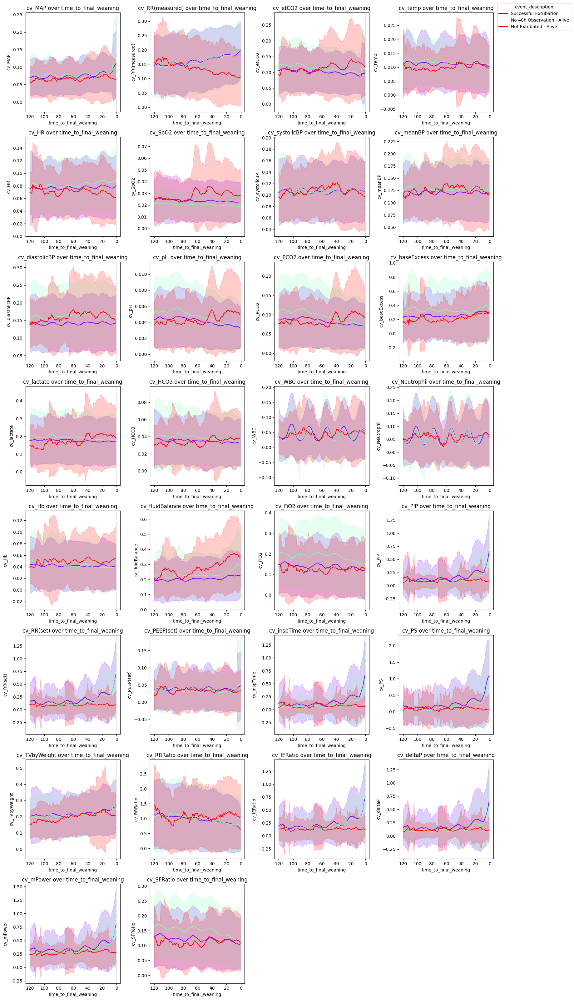

In [30]:

plot_grouped_feature_variation(
    df=df_pred_without_failure[(df_pred_without_failure.time_to_final_weaning<=120) & 
                              (df_pred_without_failure.time_to_final_weaning>0)], 
    group_column='event_description', 
    numerical_cols=[f'cv_{col}' for col in numerical_cols_tmp], 
    categorical_cols=[], 
    hours_col='time_to_final_weaning',
#     y_scaler=[0,0.5]
)

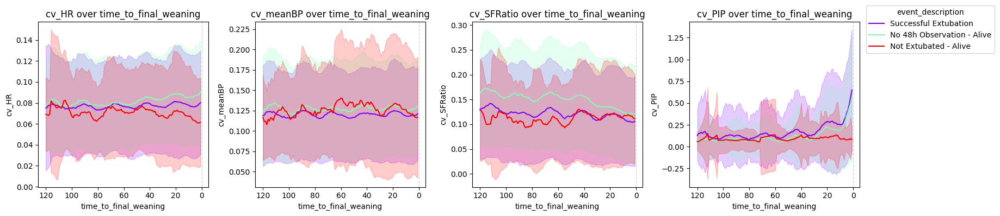

In [31]:

plot_grouped_feature_variation(
    df=df_pred_without_failure[(df_pred_without_failure.time_to_final_weaning<=120) & 
                              (df_pred_without_failure.time_to_final_weaning>0)], 
    group_column='event_description', 
    numerical_cols=[f'cv_{col}' for col in ['HR', 'meanBP', 'SFRatio', 'PIP']], 
    categorical_cols=[], 
    hours_col='time_to_final_weaning',
#     y_scaler=[0,0.5]
)

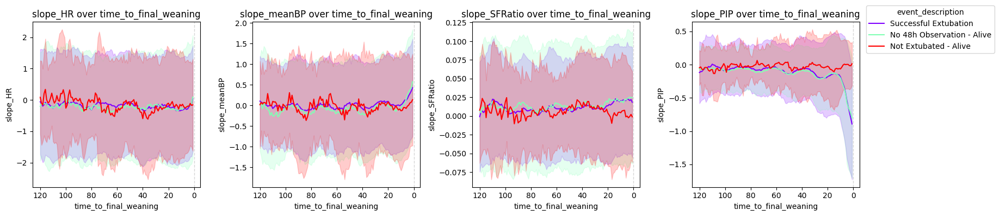

In [32]:

plot_grouped_feature_variation(
    df=df_pred_without_failure[(df_pred_without_failure.time_to_final_weaning<=120) & 
                              (df_pred_without_failure.time_to_final_weaning>0)], 
    group_column='event_description', 
    numerical_cols=[f'slope_{col}' for col in ['HR', 'meanBP', 'SFRatio', 'PIP']], 
    categorical_cols=[], 
    hours_col='time_to_final_weaning',
#     y_scaler=[0,0.5]
)



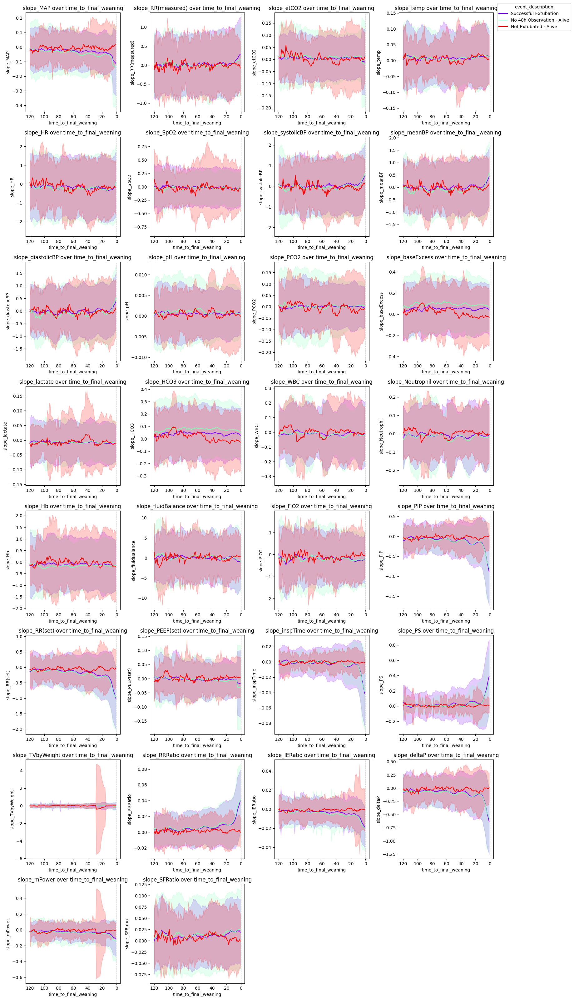

In [33]:

plot_grouped_feature_variation(
    df=df_pred_without_failure[(df_pred_without_failure.time_to_final_weaning<=120) & 
                              (df_pred_without_failure.time_to_final_weaning>0)], 
    group_column='event_description', 
    numerical_cols=[f'slope_{col}' for col in numerical_cols_tmp], 
    categorical_cols=[], 
    hours_col='time_to_final_weaning',
#     y_scaler=[0,0.5]
)

### The indicator seems correlated with ventilation measures well, but not physios

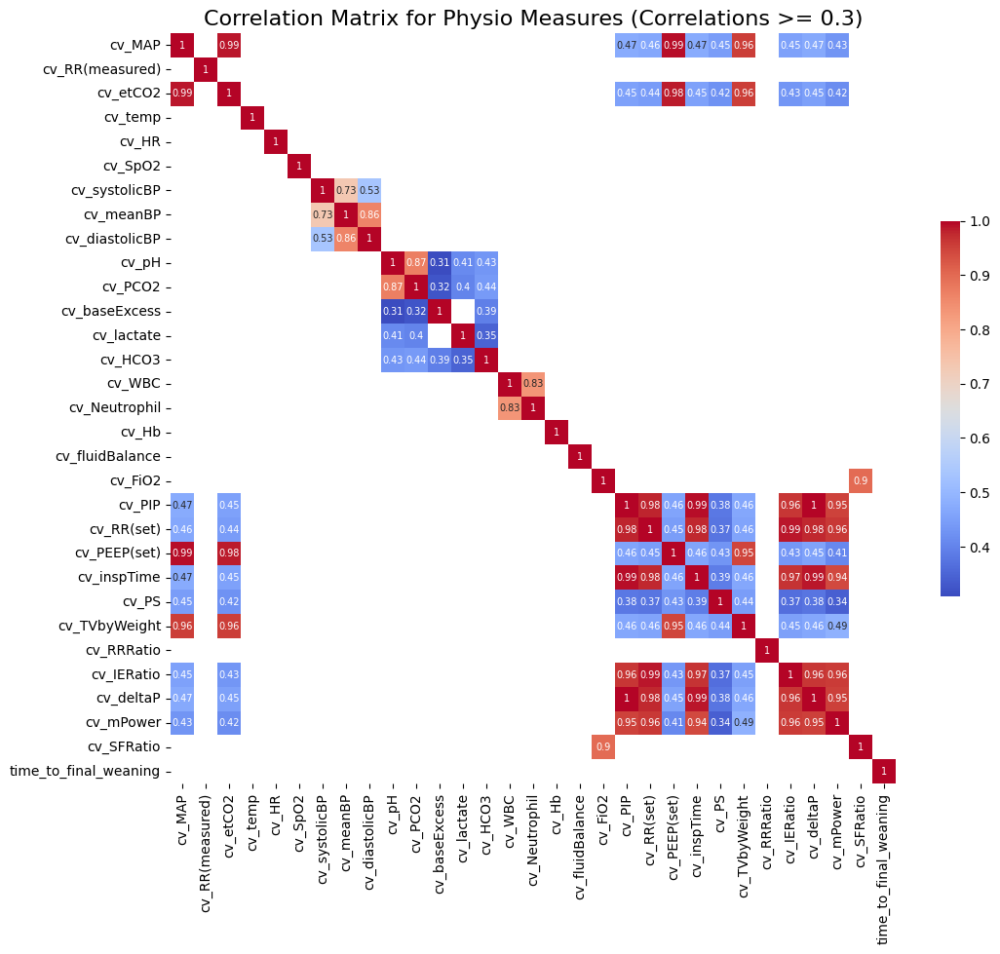

In [34]:

# Compute the correlation matrix
corr_matrix = df_pred_without_failure[[f'cv_{col}' for col in numerical_cols_tmp]+\
                       ['time_to_final_weaning']].corr(method='pearson') 

# Define correlation threshold
threshold = 0.3

# Create a mask for correlations that surpass the threshold
mask = np.abs(corr_matrix) >= threshold

# Apply the mask to the correlation matrix
filtered_corr_mat = corr_matrix[mask]

# Plot the filtered correlation matrix as a heatmap with adjusted font size
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(filtered_corr_mat, annot=True, cmap='coolwarm', annot_kws={"size": 7}, cbar_kws={'shrink': .5})

plt.title("Correlation Matrix for Physio Measures (Correlations >= " + str(threshold) + ")", fontsize=16)
plt.xticks(fontsize=10, rotation=90)  # Rotate x-axis labels and set fontsize
plt.yticks(fontsize=10, rotation=0)  # Rotate y-axis labels and set fontsize

plt.show()

### Autocorrelation Distribution

In [176]:
from statsmodels.tsa.stattools import acf

# Sample DataFrame setup
df_pred_without_failure.set_index(['encounterId', 'timestamp'], inplace=False)

# Define the maximum lag to compute autocorrelation
max_lag = 120

# Function to calculate autocorrelations for a single time-series
def calculate_autocorrelations(series, max_lag):
    try:
        # Drop missing values to calculate autocorrelation
        series = series.dropna()
        # Use statsmodels' acf function to calculate autocorrelations up to max_lag
        return acf(series, nlags=max_lag, fft=True)[1:max_lag+1]  # [1:max_lag+1] to skip lag-0
    except Exception as e:
        print(f"Error calculating ACF: {e}")
        return np.full(max_lag, np.nan)  # Return NaN array if the series is too short or other issues

# Calculate autocorrelations for each feature and each encounter
autocorrelations = {
    feature: df_pred_without_failure.groupby('encounterId')[feature]
                                    .apply(calculate_autocorrelations, max_lag=max_lag)
    for feature in numerical_cols_tmp if feature not in ['TVbyWeight', 'RRRatio', 'IERatio',
       'deltaP', 'mPower', 'SFRatio']
}

autocorr_df = pd.concat(autocorrelations, names=['feature', 'encounterId'], keys=autocorrelations.keys())
autocorr_df = autocorr_df.unstack('feature')

In [178]:
# Assuming `autocorr_df` is indexed by 'encounterId' with each column as a feature containing lists of autocorrelations
lag_columns = [f'lag_{i}' for i in range(1, max_lag + 1)]

# Initialize an empty dictionary to hold the expanded DataFrames
expanded_features = {}

# Loop through each feature, expanding its lists into a DataFrame
for feature in autocorr_df.columns:
    # Apply a lambda to expand each list into a DataFrame, handle varying lengths by specifying index
    expanded_features[feature] = autocorr_df[feature].apply(lambda x: pd.Series(x, index=lag_columns[:len(x)]))

# Concatenate all the expanded feature DataFrames along axis=1
# This results in a multi-level column index (feature, lag_number)
autocorr_expanded_df = pd.concat(expanded_features, axis=1)



In [179]:
# Calculate the median autocorrelation across patients for each feature and lag
agg_autocorr_df = autocorr_expanded_df.median(axis=0)

# If agg_autocorr_df is a Series with a MultiIndex (feature, lag), reshape it into a DataFrame
agg_autocorr_df = agg_autocorr_df.unstack(level=-1)  # Assuming the last level of the index is the lag



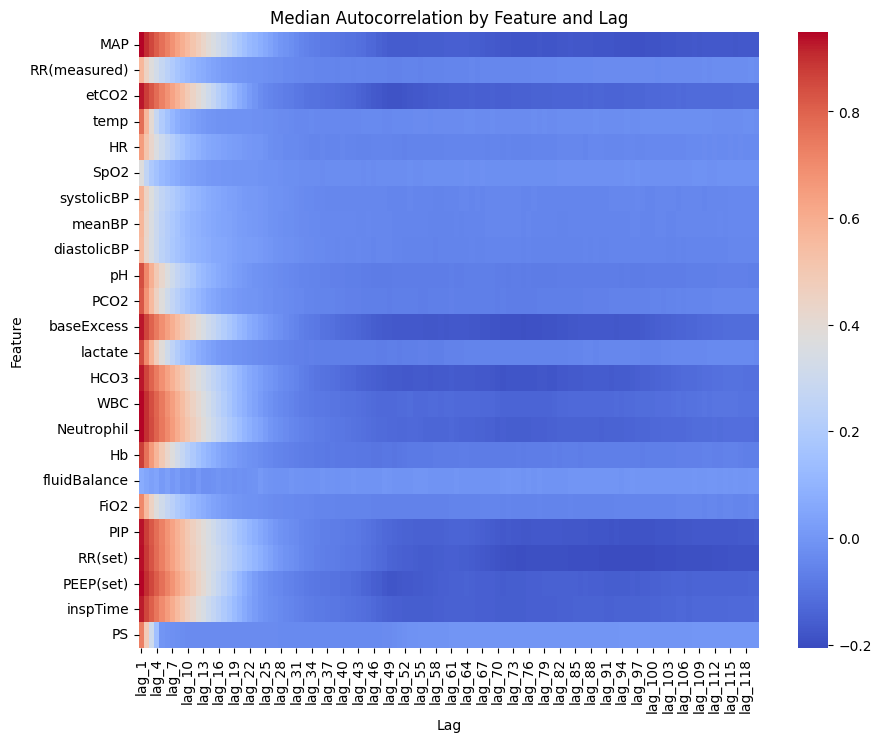

In [180]:
import seaborn as sns

plt.figure(figsize=(10, 8))
sns.heatmap(agg_autocorr_df, annot=False, cmap='coolwarm', fmt=".2f")
plt.title('Median Autocorrelation by Feature and Lag')
plt.xlabel('Lag')
plt.ylabel('Feature')
plt.show()


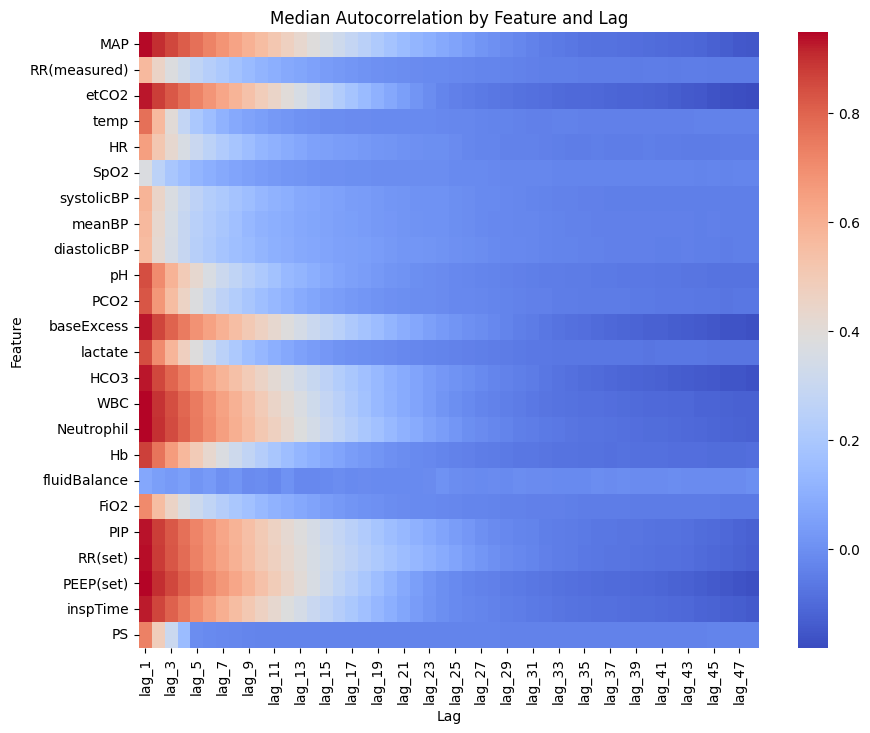

In [181]:
import seaborn as sns

plt.figure(figsize=(10, 8))
sns.heatmap(agg_autocorr_df.iloc[:, :48], annot=False, cmap='coolwarm', fmt=".2f")
plt.title('Median Autocorrelation by Feature and Lag')
plt.xlabel('Lag')
plt.ylabel('Feature')
plt.show()


In [182]:

from sklearn.utils import resample

def bootstrap_confidence_intervals(data, n_bootstraps=10, ci=95):
    """
    Calculate bootstrapped confidence intervals for the median of provided data across all columns.

    Parameters:
    - data (pd.DataFrame): Input DataFrame where each column is a feature at a specific lag.
    - n_bootstraps (int): Number of bootstrap samples to generate.
    - ci (int): The confidence interval percentage.

    Returns:
    - pd.DataFrame: Dataframe containing lower and upper bounds of the confidence intervals for each column.
    """
    ci_results = {}

    # Bootstrap the entire DataFrame by resampling rows
    for _ in range(n_bootstraps):
        # Resample the entire DataFrame (rows)
        bootstrapped_sample = resample(data)

        # Calculate the median for each column in the bootstrapped sample
        medians = bootstrapped_sample.median()

        # Collect each median calculation
        for column in data.columns:
            if column not in ci_results:
                ci_results[column] = []
            ci_results[column].append(medians[column])

    # Calculate the percentile bounds for each column
    ci_bounds = {column: [np.percentile(ci_results[column], (100-ci)/2),
                          np.median(ci_results[column]),
                          np.percentile(ci_results[column], 100-(100-ci)/2)]
                 for column in data.columns}

    # Convert to DataFrame for easier handling and visualization
    ci_df = pd.DataFrame(ci_bounds, index=['Lower CI', 'Median', 'Upper CI']).transpose()

    return ci_df
# Assuming 'autocorr_expanded_df' is properly formatted with one row per patient and columns as features with lags
# Bootstrap the entire DataFrame
ci_df = bootstrap_confidence_intervals(autocorr_expanded_df)

ci_df.head()


Lower CI    Median  Upper CI
MAP lag_1  0.944221  0.945320  0.946360
    lag_2  0.899395  0.902178  0.903643
    lag_3  0.854647  0.858635  0.860587
    lag_4  0.810442  0.815747  0.818135
    lag_5  0.764826  0.769930  0.774825

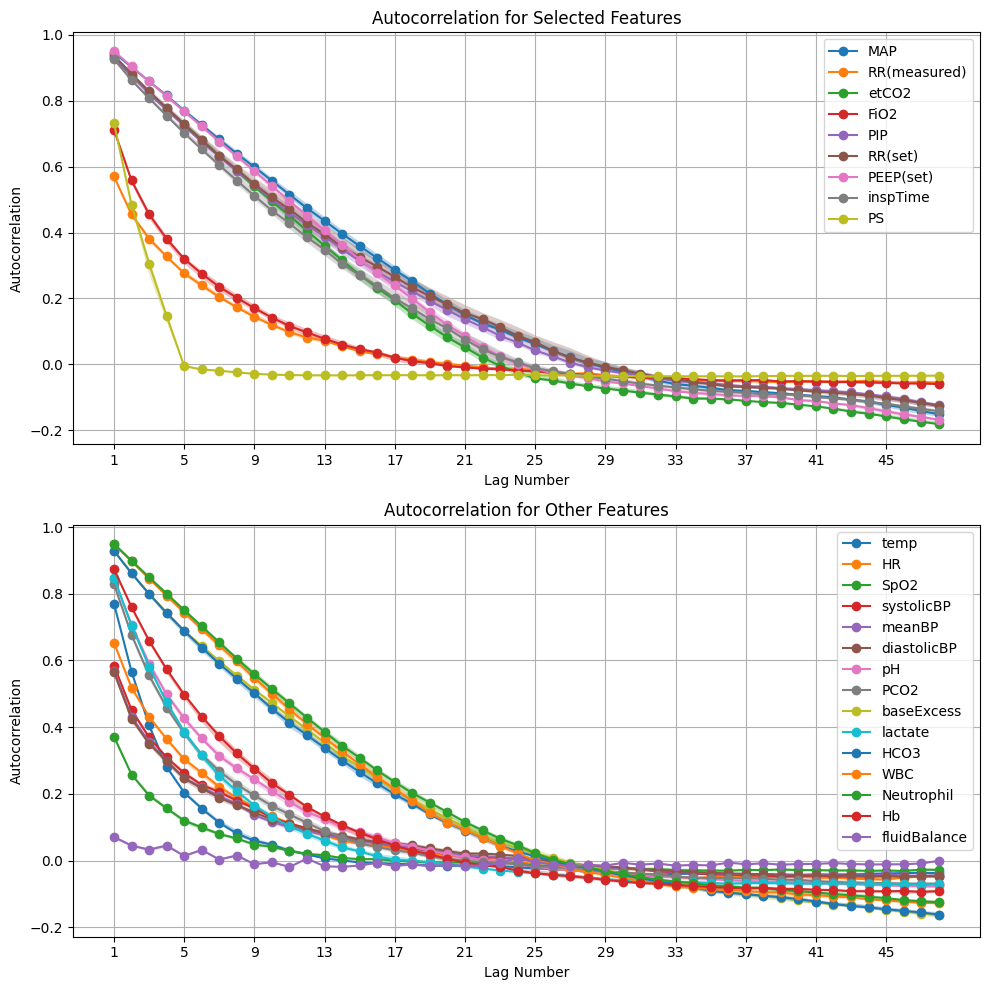

In [197]:

def plot_confidence_intervals(ci_df, selected_features):
    # Define two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))
    
    # Extract lag numbers for x-axis labels
    lags = [int(lag.split('_')[1]) for lag in ci_df.index.get_level_values(1).unique()]
    lags.sort()

    # Loop through all features and plot on appropriate subplot
    for feature in ci_df.index.get_level_values(0).unique():
        feature_data = ci_df.xs(feature, level=0)  # Cross-section the DataFrame for each feature
        median = feature_data['Median']
        lower_ci = feature_data['Lower CI']
        upper_ci = feature_data['Upper CI']
        
        # Determine which subplot to use
        ax = ax1 if feature in selected_features else ax2
        
        # Plot the median with a shaded confidence interval
        ax.fill_between(lags, lower_ci, upper_ci, alpha=0.3)
        ax.plot(lags, median, '-o', label=f'{feature}')
        
        # Set the plot details
        ax.set_title(f'Autocorrelation for {"Selected" if feature in selected_features else "Other"} Features')
        ax.set_xlabel('Lag Number')
        ax.set_ylabel('Autocorrelation')
        ax.set_xticks(lags[::4])
        ax.legend()
        ax.grid(True)
    
    plt.tight_layout()
    plt.show()

# Example usage assuming 'ci_df' is properly formatted and 'selected_features' is defined
selected_features = ['MAP', 'RR(measured)', 'etCO2', 'FiO2', 'PIP', 'RR(set)',
       'PEEP(set)', 'inspTime', 'PS']  # Specify your selected features here
plot_confidence_intervals(ci_df.drop([f'lag_{x}' for x in range(49, 121)], level=1, axis=0, inplace=False), selected_features)


In [232]:
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.multitest import multipletests

def apply_ljung_box_test(data, lags):
    """
    Apply the Ljung-Box test to each feature at specified lags.

    Parameters:
    - data (pd.DataFrame): DataFrame where each column is a feature-lag combination.
    - lags (list): List of lags to test for each feature.

    Returns:
    - pd.DataFrame: P-values from the Ljung-Box test for each feature-lag combination.
    """
    results = {}
    for column in data.index.get_level_values(0).unique():
        pvalues = acorr_ljungbox(data.loc[column, 'Median'], lags=lags, return_df=True)['lb_pvalue']
        _, adjusted_pvalues, _, _ = multipletests(pvalues, alpha=0.05, method='bonferroni')
        results[column] = adjusted_pvalues
    return pd.DataFrame(results, index=lags)

# Assuming autocorr_expanded_df is properly formatted
ljung_box_results = apply_ljung_box_test(ci_df, lags=range(1, 120))
ljung_box_results


,MAP,RR(measured),etCO2,temp,HR,SpO2,systolicBP,meanBP,diastolicBP,pH,PCO2,baseExcess,lactate,HCO3,WBC,Neutrophil,Hb,fluidBalance,FiO2,PIP,RR(set),PEEP(set),inspTime,PS
1,9.690689e-24,4.206815e-19,2.951366e-23,2.136378e-14,7.980484e-19,1.899919e-15,7.280430e-19,1.128237e-18,7.476028e-19,1.007298e-19,7.515807e-19,3.085312e-23,1.641963e-18,3.963650e-23,3.322332e-23,2.338424e-23,1.818725e-20,1.696952e-10,1.610819e-18,1.882234e-23,1.446779e-23,1.682790e-23,3.930102e-23,1.820228e-10
2,3.401436e-44,1.021851e-32,7.619385e-43,1.682312e-21,4.831519e-32,8.814639e-25,2.307372e-32,4.755864e-32,1.542226e-32,6.431958e-34,8.606205e-32,6.964132e-43,1.017530e-30,1.424359e-42,1.092194e-42,3.982465e-43,1.362689e-35,3.953300e-19,2.435216e-31,1.883082e-43,9.145316e-44,1.688473e-43,1.469520e-42,4.543911e-13
3,2.172625e-62,6.218582e-43,7.722763e-60,4.054591e-25,7.691720e-42,6.059211e-31,1.052746e-42,2.919018e-42,3.618316e-43,1.028645e-44,3.568011e-41,4.269428e-60,4.785009e-39,1.689987e-59,1.501779e-59,2.183825e-60,3.270571e-47,3.459328e-23,8.535494e-41,4.216381e-61,1.095044e-61,4.971553e-61,2.076221e-59,6.671606e-13
4,1.727004e-78,1.484399e-50,1.869250e-74,5.415627e-27,4.179455e-49,6.117700e-35,8.984985e-51,3.729756e-50,1.721216e-51,5.186366e-53,4.864332e-48,3.880396e-75,1.068240e-44,3.474675e-74,4.915595e-74,2.304581e-75,4.314714e-56,9.231670e-26,8.199159e-48,1.295070e-76,1.534641e-77,2.809017e-76,6.140303e-74,3.354695e-12
5,1.170148e-92,2.968808e-56,6.697826e-87,6.654488e-28,1.537095e-54,1.263860e-37,3.701343e-57,1.979811e-56,3.385446e-58,2.081378e-59,4.345151e-53,3.046616e-88,1.733076e-48,7.175657e-87,2.259682e-86,2.895818e-88,8.004197e-63,1.283683e-26,4.856031e-53,3.478664e-90,1.620209e-91,2.025482e-89,2.192699e-86,1.486297e-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,0.000000e+00,1.509580e-61,2.260741e-183,1.152860e-08,1.115744e-68,5.761698e-24,2.379665e-106,9.706443e-108,9.639230e-128,1.041919e-103,7.881595e-71,1.803235e-242,2.604585e-38,2.308930e-221,3.146915e-197,5.291836e-232,1.667579e-82,1.094554e-05,1.539644e-70,0.000000e+00,0.000000e+00,5.274529e-225,6.418428e-223,1.000000e+00
116,0.000000e+00,8.765022e-62,4.603939e-184,5.511130e-09,3.035777e-69,4.085353e-24,1.448236e-107,5.750999e-109,2.839952e-129,3.308693e-105,2.336889e-71,5.027665e-243,1.253567e-38,9.817991e-222,3.492832e-198,4.676445e-233,2.321317e-83,5.782630e-06,9.552613e-72,0.000000e+00,0.000000e+00,4.029947e-226,4.624618e-224,1.000000e+00
117,0.000000e+00,6.118803e-62,1.722880e-184,2.962215e-09,8.908372e-70,3.053203e-24,1.452920e-108,4.675957e-110,1.421349e-130,1.639646e-106,8.515481e-72,2.286971e-243,6.529194e-39,6.110500e-222,7.702586e-199,8.524281e-234,4.791337e-84,2.222776e-06,8.858281e-73,0.000000e+00,0.000000e+00,7.000719e-227,7.616678e-225,1.000000e+00
118,0.000000e+00,5.706784e-62,1.258749e-184,1.750950e-09,3.585609e-70,2.724516e-24,3.214320e-109,8.134141e-111,1.423232e-131,1.736366e-107,4.614638e-72,1.876275e-243,4.372027e-39,6.331555e-222,3.779802e-199,3.694633e-234,1.721724e-84,2.718551e-07,1.483275e-73,0.000000e+00,0.000000e+00,3.170856e-227,3.083969e-225,1.000000e+00


In [221]:
a

'lb_stat'

In [207]:
def test_significance(ci_df):
    results = {}
    for index, row in ci_df.iterrows():
        feature, lag = index
        lower_ci, median, upper_ci = row['Lower CI'], row['Median'], row['Upper CI']
        # Check if the CI includes zero
        if lower_ci <= 0 <= upper_ci:
            results[(feature, lag)] = "Not Significant"
        else:
            results[(feature, lag)] = "Significant"
    return results

# Run the significance test
significance_results = test_significance(ci_df)



In [209]:
significance_results[('MAP', 'lag_1')]

'Significant'

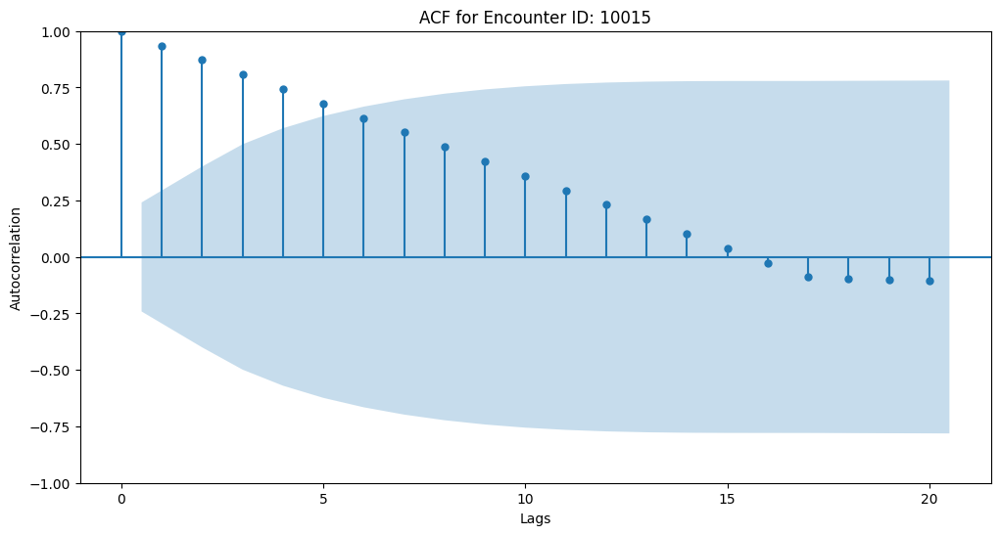

In [79]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf

# Sample DataFrame setup
df_pred_without_failure.set_index(['encounterId', 'timestamp'], inplace=False)

# Define the maximum lag for the autocorrelation calculation
max_lag = 20  # Adjust this based on how far back you expect influences to persist

# Example feature computation for autocorrelation
feature = 'inspTime'

# Function to plot ACF with confidence intervals for a single time series
def plot_acf_with_confidence(series, max_lag, title):
    fig, ax = plt.subplots(figsize=(12, 6))
    plot_acf(series, ax=ax, lags=max_lag, alpha=0.05)  # alpha for 95% confidence interval
    ax.set_title(title)
    ax.set_xlabel('Lags')
    ax.set_ylabel('Autocorrelation')
    plt.show()

# Calculate and plot ACF for each patient's feature data
for encounter_id, group in df.groupby('encounterId'):
    # Assuming data cleaning and potential interpolation is already done
    if feature in group.columns:
        series = group[feature].dropna()
        if not series.empty:
            plot_acf_with_confidence(series, max_lag, f'ACF for Encounter ID: {encounter_id}')
            # Break or continue depending on whether you want plots for all patients or just one example
            break


### Draft

In [56]:
df_pred = df.copy() 
df_pred['vent_end_time_tmp'] =  np.minimum(df_pred.first_extubation_time, df_pred.vent_end_time)
df_pred = df_pred[df_pred.timestamp <= df_pred.vent_end_time_tmp] 
        # here we cut-off at first extubation
df_pred = df_pred[(df_pred.timestamp >= df_pred.vent_start_time)]
df_pred['time_to_event'] = (df_pred.vent_end_time_tmp-df_pred.timestamp).astype(int)
df_pred.drop(columns='vent_end_time_tmp', inplace=True)
df_pred = df_pred.groupby('encounterId').filter(lambda x: x.airwayStatus_Extubated.sum()>0)


In [57]:

mask = df_pred['num_intub']>1
df_pred.loc[mask, 'Extubation_outcome'] = 'Failed'
mask = (df_pred['num_intub']==1) & df_pred.event_description.str.contains('Deceased')
df_pred.loc[mask, 'Extubation_outcome'] = 'Failed'
df_pred['Extubation_outcome'].fillna('Succeed', inplace=True)


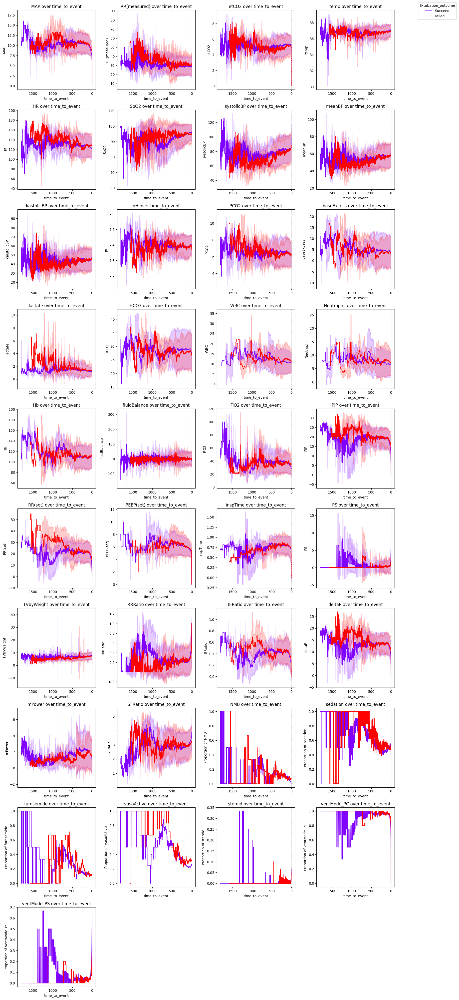

In [58]:

plot_grouped_feature_variation(
    df=df_pred, 
    group_column='Extubation_outcome', 
    numerical_cols=numerical_cols_tmp, 
    categorical_cols=categoric_cols_tmp, 
    hours_col='time_to_event'
)

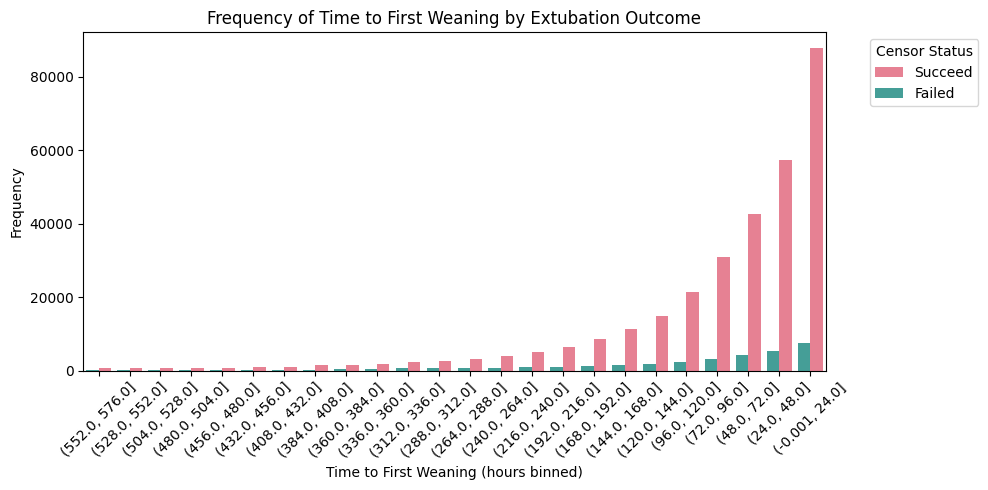

In [61]:

plt.figure(figsize=(10,5))  # Widen the figure to allow more space for each bar


# Define bin edges for hours; adjust the range and bin width as needed
bin_edges = np.arange(df_pred['time_to_event'].min(), 600, 24)

# Bin the 'time_to_event' data
df_pred['time_to_event_binned'] = pd.cut(df_pred['time_to_event'], bins=bin_edges, include_lowest=True)

# Choose a color palette with enough contrast
palette = sns.color_palette('husl', n_colors=df_pred['Extubation_outcome'].nunique())

# Create the count plot
sns.countplot(data=df_pred, x='time_to_event_binned', hue='Extubation_outcome', palette=palette)

plt.gca().invert_xaxis()  # Invert the x-axis on the current Axes object
# Improve the x-axis
plt.xticks(rotation=45)  # Rotate the labels for better legibility
plt.xlabel('Time to First Weaning (hours binned)')
plt.ylabel('Frequency')
plt.title('Frequency of Time to First Weaning by Extubation Outcome')

# Move the legend outside the plot to avoid covering the bars
plt.legend(title='Censor Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()  # Adjust the layout
plt.show()


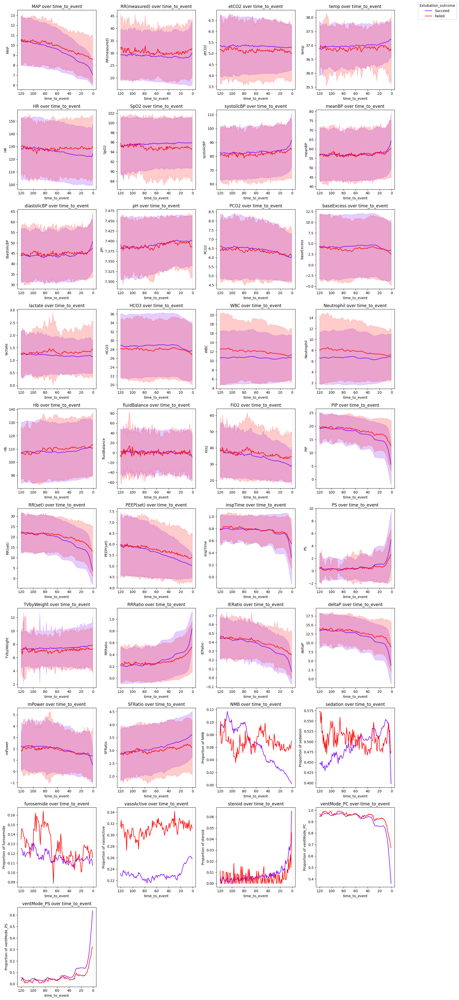

In [63]:

plot_grouped_feature_variation(
    df=df_pred[(df_pred.time_to_event>0) & (df_pred.time_to_event<=120)], 
    group_column='Extubation_outcome', 
    numerical_cols=numerical_cols_tmp, 
    categorical_cols=categoric_cols_tmp, 
    hours_col='time_to_event'
)